In [ ]:
import sys, os
if 'google.colab' in sys.modules and not os.path.exists('.setup_complete'):
    !wget -q https://raw.githubusercontent.com/yandexdataschool/Practical_RL/master/setup_colab.sh -O- | bash

    !pip -q install gymnasium[mujoco,toy_text]==1.0.0
    !pip -q install mujoco==2.3.7

    %env MUJOCO_GL=egl

    !touch .setup_complete

# This code creates a virtual display to draw game images on.
# It will have no effect if your machine has a monitor.
if type(os.environ.get("DISPLAY")) is not str or len(os.environ.get("DISPLAY")) == 0:
    !bash ../xvfb start
    os.environ['DISPLAY'] = ':1'

In [ ]:
import gymnasium as gym
import numpy as np
import matplotlib.pyplot as plt

from gymnasium.wrappers import RecordVideo
from IPython.display import clear_output

# 1. Cross-Entropy Method

This notebook will teach you to solve reinforcement learning problems with crossentropy method.

Initialise points distribution $q_0$.
Repeat until convergence, $k = 0, 1, \dots$:
1. Sample from $\{x_i \}_{i=1}^N ∼ q_k$
2. Select $M \leq N$ elite point based on criteria
3. Update to get new distribution $q_{k+1}$

Distribution update: $D_{KL}(p_{\text{elites}} || q) = \mathbb{E}_{p_{\text{elites}}} [ \log(\dfrac{p_{\text{elites}}(x)}{q(x)})] = -\mathbb{E}_{p_{\text{elites}}}[\log(q(x))] + const \to \min_q$

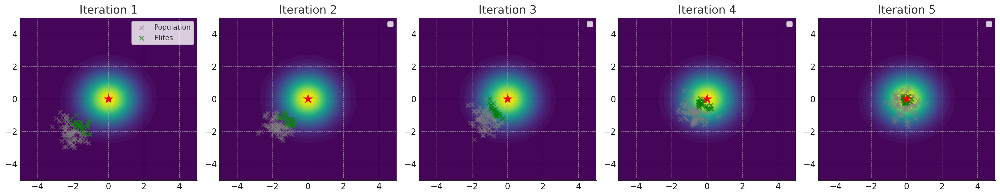

(314, {'prob': 1.0, 'action_mask': array([1, 1, 0, 0, 0, 0], dtype=int8)})


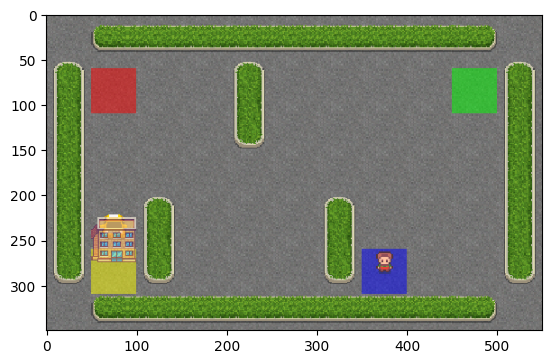

In [ ]:
env = gym.make("Taxi-v3", render_mode="rgb_array")
print(env.reset(seed=0))
plt.imshow(env.render())

In [ ]:
n_states = env.observation_space.n
n_actions = env.action_space.n

print(f"observation_space: {env.observation_space}")
print(f"action_space: {env.action_space}")

observation_space: Discrete(500)
action_space: Discrete(6)


### Create stochastic policy

This time our policy should be a probability distribution.

```policy[s,a] = P(take action a | in state s)```

Since we still use integer state and action representations, you can use a 2-dimensional array to represent the policy.

Please initialize the policy __uniformly__, that is, probabililities of all actions should be equal.

In [ ]:
def initialize_policy(n_states, n_actions):
    # <YOUR CODE: create an array to store action probabilities>
    return policy

policy = initialize_policy(n_states, n_actions)

### Play the game

Just like before, but we also record all states and actions we took.

In [ ]:
def generate_session(env, policy, t_max=10**4):
    """
    Play game until end or for t_max ticks.
    :param policy: an array of shape [n_states,n_actions] with action probabilities
    :returns: list of states, list of actions and sum of rewards
    """
    states, actions = [], []
    total_reward = 0.

    s, _ = env.reset()

    for t in range(t_max):
        # Hint: you can use np.random.choice for sampling action
        # https://numpy.org/doc/stable/reference/random/generated/numpy.random.choice.html

        a = #<YOUR CODE: sample action from policy

        new_s, r, terminated, truncated, _ = env.step(a)

        # Record information we just got from the environment.
        states.append(s)
        actions.append(a)
        total_reward += r

        s = new_s
        if terminated or truncated:
            break

    return states, actions, total_reward

In [ ]:
s, a, r = generate_session(env, policy)
assert isinstance(s, list)
assert isinstance(a, list)
assert len(s) == len(a)
assert isinstance(r, float)

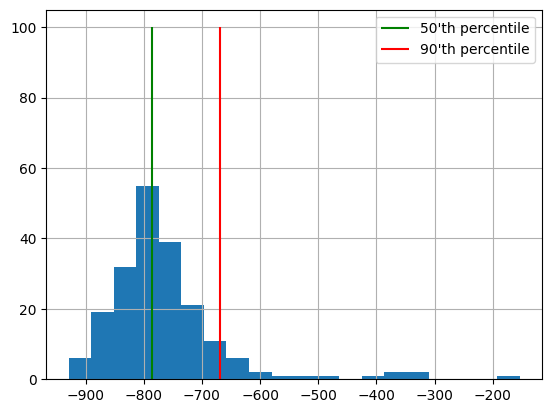

In [ ]:
sample_rewards = [generate_session(env, policy, t_max=1000)[-1] for _ in range(200)]

plt.hist(sample_rewards, bins=20)
plt.vlines([np.percentile(sample_rewards, 50)], [0], [100], label="50'th percentile", color='green')
plt.vlines([np.percentile(sample_rewards, 90)], [0], [100], label="90'th percentile", color='red')
plt.legend()
plt.grid()

In [ ]:
def select_elites(states_batch, actions_batch, rewards_batch, percentile):
    """
    Select states and actions from games that have rewards >= percentile
    :param states_batch: list of lists of states, states_batch[session_i][t]
    :param actions_batch: list of lists of actions, actions_batch[session_i][t]
    :param rewards_batch: list of rewards, rewards_batch[session_i]

    :returns: elite_states,elite_actions, both 1D lists of states and respective actions from elite sessions

    Please return elite states and actions in their original order
    [i.e. sorted by session number and timestep within session]

    If you are confused, see examples below. Please don't assume that states are integers
    (they will become different later).
    """

    #<YOUR CODE: compute minimum reward for elite sessions. Hint: use np.percentile()>

    return elite_states, elite_actions

In [ ]:
states_batch = [
    [1, 2, 3],     # game1
    [4, 2, 0, 2],  # game2
    [3, 1],        # game3
]

actions_batch = [
    [0, 2, 4],     # game1
    [3, 2, 0, 1],  # game2
    [3, 3],        # game3
]
rewards_batch = [
    3,  # game1
    4,  # game2
    5,  # game3
]

test_result_0 = select_elites(states_batch, actions_batch, rewards_batch, percentile=0)
test_result_30 = select_elites(states_batch, actions_batch, rewards_batch, percentile=30)
test_result_90 = select_elites(states_batch, actions_batch, rewards_batch, percentile=90)
test_result_100 = select_elites(states_batch, actions_batch, rewards_batch, percentile=100)

assert np.all(test_result_0[0] == [1, 2, 3, 4, 2, 0, 2, 3, 1])  \
    and np.all(test_result_0[1] == [0, 2, 4, 3, 2, 0, 1, 3, 3]), \
    "For percentile 0 you should return all states and actions in chronological order"
assert np.all(test_result_30[0] == [4, 2, 0, 2, 3, 1]) and \
    np.all(test_result_30[1] == [3, 2, 0, 1, 3, 3]), \
    "For percentile 30 you should only select states/actions from two first"
assert np.all(test_result_90[0] == [3, 1]) and \
    np.all(test_result_90[1] == [3, 3]), \
    "For percentile 90 you should only select states/actions from one game"
assert np.all(test_result_100[0] == [3, 1]) and\
    np.all(test_result_100[1] == [3, 3]), \
    "Please make sure you use >=, not >. Also double-check how you compute percentile."

print("Ok!")

Ok!


In [ ]:
def get_new_policy(elite_states, elite_actions):
    """
    Given a list of elite states/actions from select_elites,
    return a new policy where each action probability is proportional to

        policy[s_i,a_i] ~ #[occurrences of s_i and a_i in elite states/actions]

    Don't forget to normalize the policy to get valid probabilities and handle the 0/0 case.
    For states that you never visited, use a uniform distribution (1/n_actions for all states).

    :param elite_states: 1D list of states from elite sessions
    :param elite_actions: 1D list of actions from elite sessions

    """

    new_policy = np.zeros([n_states, n_actions])

    # <YOUR CODE: set probabilities for actions given elite states & actions>
    # Don't forget to set 1/n_actions for all actions in unvisited states.

    return new_policy

In [ ]:
elite_states = [1, 2, 3, 4, 2, 0, 2, 3, 1]
elite_actions = [0, 2, 4, 3, 2, 0, 1, 3, 3]

new_policy = get_new_policy(elite_states, elite_actions)

assert np.isfinite(new_policy).all(), \
    "Your new policy contains NaNs or +-inf. Make sure you don't divide by zero."
assert np.all(new_policy >= 0), \
    "Your new policy can't have negative action probabilities"
assert np.allclose(new_policy.sum(axis=-1), 1), \
    "Your new policy should be a valid probability distribution over actions"

reference_answer = np.array([
    [1.,  0.,  0.,  0.,  0.],
    [0.5,  0.,  0.,  0.5,  0.],
    [0.,  0.33333333,  0.66666667,  0.,  0.],
    [0.,  0.,  0.,  0.5,  0.5]])
assert np.allclose(new_policy[:4, :5], reference_answer)

print("Ok!")

Ok!


### Training loop
Generate sessions, select N best and fit to those.

In [ ]:
def show_progress(rewards_batch, log, percentile, reward_range=[-990, +10]):
    """
    A convenience function that displays training progress.
    No cool math here, just charts.
    """

    mean_reward = np.mean(rewards_batch)
    threshold = np.percentile(rewards_batch, percentile)
    log.append([mean_reward, threshold])

    plt.figure(figsize=[8, 4])
    plt.subplot(1, 2, 1)
    plt.plot(list(zip(*log))[0], label='Mean rewards')
    plt.plot(list(zip(*log))[1], label='Reward thresholds')
    plt.legend()
    plt.grid()

    plt.subplot(1, 2, 2)
    plt.hist(rewards_batch, range=reward_range)
    plt.vlines([np.percentile(rewards_batch, percentile)],
               [0], [100], label="percentile", color='red')
    plt.legend()
    plt.grid()
    clear_output(True)
    print(f"mean reward = {mean_reward:.3f}, threshold={threshold:.3f}")
    plt.show()

In [ ]:
# reset policy just in case
policy = initialize_policy(n_states, n_actions)

In [ ]:
n_sessions = 250     # sample this many sessions
percentile = 50      # discard this percentage of sessions with lowest rewards
learning_rate = 0.5  # how quickly the policy is updated, on a scale from 0 to 1

log = []

for i in range(100):
    %time sessions = # <YOUR CODE: generate a list of n_sessions new sessions>

    states_batch, actions_batch, rewards_batch = zip(*sessions)

    elite_states, elite_actions = #<YOUR CODE: select elite states & actions>

    new_policy = #<YOUR CODE: compute new policy>

    policy = learning_rate * new_policy + (1 - learning_rate) * policy

    # display results on chart
    show_progress(rewards_batch, log, percentile)

### Reflecting on results

You may have noticed that the taxi problem quickly converges from less than -1000 to a near-optimal score and then descends back into -50/-100. This is in part because the environment has some innate randomness. Namely, the starting points of passenger/driver change from episode to episode.

In case CEM failed to learn how to win from one distinct starting point, it will simply discard it because no sessions from that starting point will make it into the "elites".

To mitigate that problem, you can either reduce the threshold for elite sessions (duct tape way) or change the way you evaluate strategy (theoretically correct way). For each starting state, you can sample an action randomly, and then evaluate this action by running _several_ games starting from it and averaging the total reward. Choosing elite sessions with this kind of sampling (where each session's reward is counted as the average of the rewards of all sessions with the same starting state and action) should improve the performance of your policy.

# 2. Deep Cross-Entropy Method

Now assume that $\pi_\theta(s)$ is a neural network instead of just a table.
So we optimise either Cross-Entropy Loss or MSE (or Gaussian Likelihood) depending on acton space.

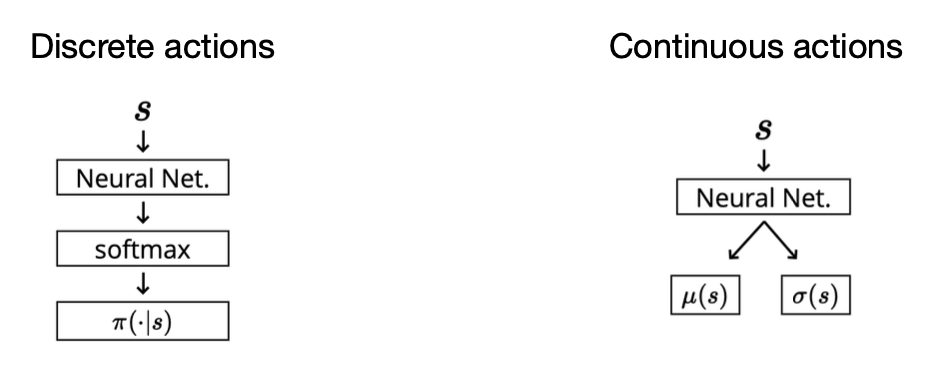

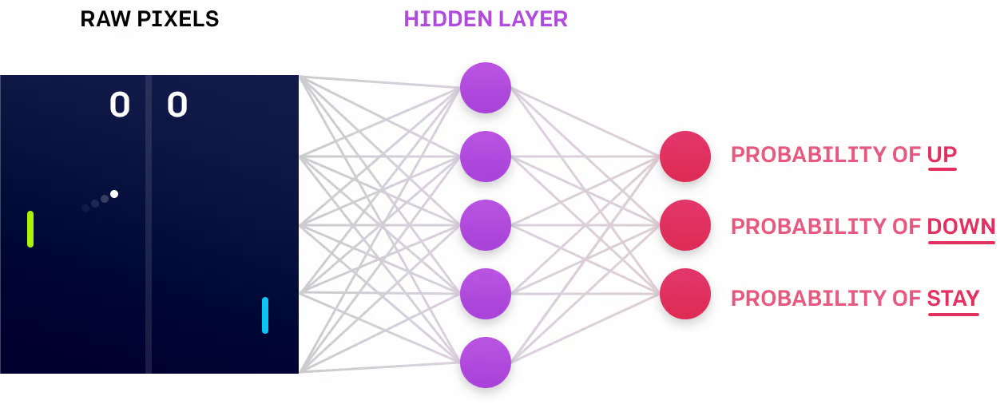

# 3. [Evolution Strategies as a Scalable Alternative to RL](https://openai.com/research/evolution-strategies)

**Evolution Strategies for RL**

$F(\theta)$ is the stochastic return provided by an
environment, and $\theta$ are the parameters of a deterministic or stochastic policy $\pi_\theta$ describing an
agent acting in that environment, controlled by either discrete or continuous actions. Since the actions are allowed to be discrete and the policy is allowed to be deterministic, $F(\theta)$ can be non-smooth in $\theta$.

1. **Objective:**
Assuming $\psi \sim p_\theta = \mathcal{N}(\theta, \sigma^2 I)$:
$$\mathbb{E}_{\psi \sim p_\theta} [F(\psi)] = \mathbb{E}_{\delta \sim \mathcal{N}(0, I)} [F(\theta + \sigma \delta)]$$

2. **Gradient:**
$$\nabla_\theta \mathbb{E}_{\delta \sim \mathcal{N}(0, I)} [F(\theta + \sigma \delta)] = \dfrac{1}{\sigma} \mathbb{E}_{\delta \sim \mathcal{N}(0, I)} [F(\theta + \sigma \delta) \delta]$$


2. **Policy Representation**:
The policy $\pi$ can be either MLP or CNN depending on the state.

3. **Sampling and Perturbations**:
  * Generate $N$ perturbations $\delta_i \sim \mathcal{N}(0, I)$
  * Compute returns $F_i = F(\theta_{old} + \sigma \delta_i)$

4. **Parameter Update Rule**:
Update the parameters using a weighted sum of perturbations:
\begin{equation}
    \theta_{new} \leftarrow \theta_{old} + \frac{\alpha}{N \sigma} \sum_{i=1}^{N} F_i \delta_{i}
\end{equation}
where $\alpha$ is the learning rate.

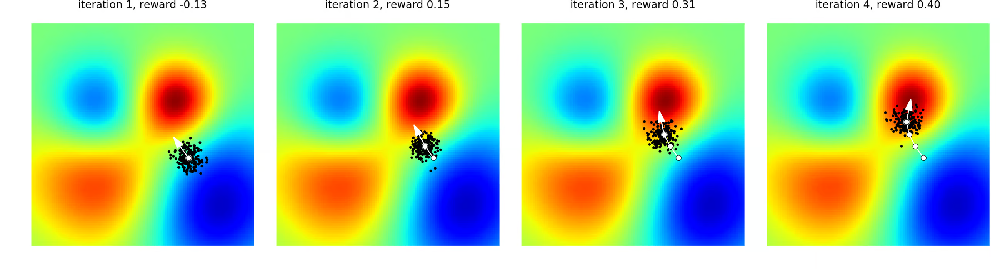

## 4. [Augmented Random Search](https://arxiv.org/abs/1803.07055)

**Augmented Random Search** is a model-free, policy-based reinforcement learning algorithm. It does not require a gradient-based approach, which is a significant departure from popular methods or policy gradient methods. Instead, ARS optimizes policy parameters directly through random search.

1. **Objective Function**:
The objective is to maximize the expected return $J(\theta)$, the cumulative reward:
\begin{equation}
    J(\theta) = \mathbb{E}_{\pi_\theta} \left[ \sum_{t=0}^{T} R_t \right] → \max_{\theta}
\end{equation}
where $R_t$ is the reward at time $t$ and $T$ is the episode length.

2. **Policy Representation**:
The policy $\pi$ maps states $s$ to actions $a$, typically linear in this context:
\begin{equation}
    \pi_\theta(s) = \theta^T s
\end{equation}
where $\theta \in \mathbb{R}^{|S| \times |A|}$ is parameter matrix.

3. **Sampling and Perturbations**:
Generate $N$ perturbations $\delta_i$ from a normal distribution with a standard error $\sigma$:
\begin{equation}
    \theta_{old} \pm \delta_i, \quad i = 1, 2, \dots, N
\end{equation}

4. **Policy Evaluation**:

  **4.1. State Normalization (ARS-V2)**
Normalize states $s$ using running statistics (mean and standard deviation)

  **4.2. Compute returns for perturbed policies**
\begin{align}
    J(\theta_{old} + \delta_i) \quad &\text{and} \quad J(\theta_{old} - \delta_i)
\end{align}

5. **Parameter Update Rule**:
Update the parameters using a weighted sum of perturbations:
\begin{equation}
    \theta_{new} \leftarrow \theta_{old} + \frac{\alpha}{b \sigma_R} \sum_{i=1}^{b} \left( J(\theta_{old} + \delta_{i}) - J(\theta_{old} - \delta_{i}) \right) \delta_{i}
\end{equation}
where $\alpha$ is the learning rate, $b \leq N$ is the number of top-performing perturbations, and $\sigma_R$ is the standard deviation of the $2b$ returns.


In [ ]:
class LinearPolicy:
    def __init__(self, state_dim=None, action_dim=None, weights=None):
        self.weights = np.zeros((state_dim, action_dim)) if weights is None else weights

    def get_action(self, state):
        return self.weights.T @ state

    def update_weights(self, weights):
        self.weights = weights

In [ ]:
def evaluate_policy(env, policy, rollout_length):
    state, _ = env.reset()
    episode_reward = 0
    for i in range(rollout_length):
        action = policy.get_action(state)
        next_s, reward, terminated, truncated, _ = env.step(action)
        episode_reward += reward
        state = next_s
        if terminated or truncated:
            break

    return episode_reward

In [Mujoco](https://gymnasium.farama.org/environments/mujoco/) tasks, which often involve complex physical simulations and continuous action spaces, ARS has been shown to perform well. Its ability to handle continuous, high-dimensional action spaces without the need for complex neural network architectures or gradient calculations makes it particularly suited for such environments.

action_space: Box(-1.0, 1.0, (2,), float32)
state_space: Box(-inf, inf, (8,), float64)


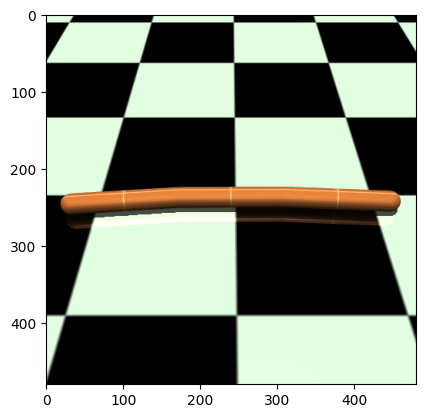

In [ ]:
import gymnasium as gym
from gymnasium.wrappers import RecordVideo
import matplotlib.pyplot as plt

env = gym.make("Swimmer-v4", render_mode="rgb_array")
print(f"action_space: {env.action_space}")
print(f"state_space: {env.observation_space}")
env.reset()
plt.imshow(env.render());

In [ ]:
env = gym.make("Swimmer-v4", render_mode="rgb_array")
state_dim = env.observation_space.shape[0]
action_dim = env.action_space.shape[0]
policy = LinearPolicy(weights=np.random.randn(state_dim, action_dim))
evaluate_policy(env, policy, 1000)

16.64415783706387

In [ ]:
def pertubate_and_evaluate(env, weights, delta, rollout_length):
    policy = LinearPolicy(weights=weights + delta)
    return evaluate_policy(env, policy, rollout_length)

In [ ]:
from joblib import Parallel, delayed
from IPython.display import clear_output

def train_augmented_random_search(env,
                                  policy=None,
                                  n_iter=100,
                                  sigma=0.02,
                                  n_jobs=16,
                                  n_directions=16,
                                  top_n_directions=8,
                                  learning_rate=0.01,
                                  rollout_length=1000):

    state_dim = env.observation_space.shape[0]
    action_dim = env.action_space.shape[0]
    policy = policy or LinearPolicy(state_dim=state_dim, action_dim=action_dim)
    reward_history = []

    for i in range(n_iter):
        reward_history.append(evaluate_policy(env, policy, rollout_length))

        deltas = np.random.randn(n_directions, state_dim, action_dim) # sample noise
        weights = policy.weights
        positive_reward = np.array(
            Parallel(n_jobs=n_jobs)(
                delayed(pertubate_and_evaluate)(env, weights,
                                                sigma * deltas[j], rollout_length)
                for j in range(n_directions)
            )
        )
        negative_reward = np.array(
            Parallel(n_jobs=n_jobs)(
                delayed(pertubate_and_evaluate)(env, weights,
                                                -sigma * deltas[j], rollout_length)
                for j in range(n_directions)
            )
        )

        sigma_reward = np.std([*positive_reward, *negative_reward])

        gradient = np.mean(
            (positive_reward - negative_reward).reshape(n_directions, 1, 1) * deltas, axis=0
        )
        new_weights = policy.weights + learning_rate / sigma_reward * gradient
        policy.update_weights(new_weights)

        if (i + 1) % 10 == 0:
            clear_output(wait=True)
            plt.figure()
            plt.plot(reward_history)
            plt.grid()
            plt.xlabel("n_iterations")
            plt.ylabel("total_reward")
            plt.show()

    return policy

## Swimmer

reward = forward_reward - ctrl_cost

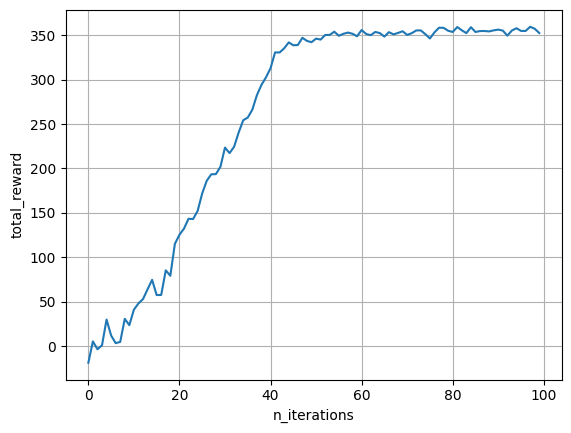

In [ ]:
env = gym.make("Swimmer-v4", render_mode="rgb_array")
policy = train_augmented_random_search(env=env)

In [ ]:
with gym.make("Swimmer-v4", render_mode="rgb_array") as env, RecordVideo(
    env=env, video_folder="./videos"
) as env_monitor:
    evaluate_policy(env_monitor, policy, 1000)

/usr/local/lib/python3.10/dist-packages/gymnasium/wrappers/record_video.py:94: UserWarning: WARN: Overwriting existing videos at /content/videos folder (try specifying a different `video_folder` for the `RecordVideo` wrapper if this is not desired)
  logger.warn(


Moviepy - Building video /content/videos/rl-video-episode-0.mp4.
Moviepy - Writing video /content/videos/rl-video-episode-0.mp4



Moviepy - Done !
Moviepy - video ready /content/videos/rl-video-episode-0.mp4


In [ ]:
# Show video. This may not work in some setups. If it doesn't
# work for you, you can download the videos and view them locally.

from pathlib import Path
from base64 import b64encode
from IPython.display import HTML

video_paths = sorted([s for s in Path('videos').iterdir() if s.suffix == '.mp4'])
video_path = video_paths[0]  # You can also try other indices

if 'google.colab' in sys.modules:
    # https://stackoverflow.com/a/57378660/1214547
    with video_path.open('rb') as fp:
        mp4 = fp.read()
    data_url = 'data:video/mp4;base64,' + b64encode(mp4).decode()
else:
    data_url = str(video_path)

HTML("""
<video width="640" height="480" controls>
  <source src="{}" type="video/mp4">
</video>
""".format(data_url))

## HalfCheetah

reward = forward_reward - ctrl_cost

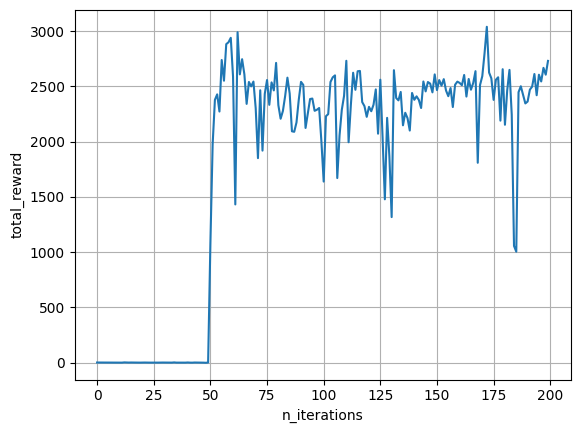

In [ ]:
env = gym.make("HalfCheetah-v4", render_mode="rgb_array")
policy = train_augmented_random_search(env=env, n_iter=200)

In [ ]:
with gym.make("HalfCheetah-v4", render_mode="rgb_array") as env, RecordVideo(
    env=env, video_folder="./videos"
) as env_monitor:
    evaluate_policy(env_monitor, policy, 1000)

Moviepy - Building video /content/videos/rl-video-episode-0.mp4.
Moviepy - Writing video /content/videos/rl-video-episode-0.mp4



Moviepy - Done !
Moviepy - video ready /content/videos/rl-video-episode-0.mp4


In [ ]:
# Show video. This may not work in some setups. If it doesn't
# work for you, you can download the videos and view them locally.

from pathlib import Path
from base64 import b64encode
from IPython.display import HTML

video_paths = sorted([s for s in Path('videos').iterdir() if s.suffix == '.mp4'])
video_path = video_paths[0]  # You can also try other indices

if 'google.colab' in sys.modules:
    # https://stackoverflow.com/a/57378660/1214547
    with video_path.open('rb') as fp:
        mp4 = fp.read()
    data_url = 'data:video/mp4;base64,' + b64encode(mp4).decode()
else:
    data_url = str(video_path)

HTML("""
<video width="640" height="480" controls>
  <source src="{}" type="video/mp4">
</video>
""".format(data_url))

## Ant

reward = healthy_reward + forward_reward - ctrl_cost

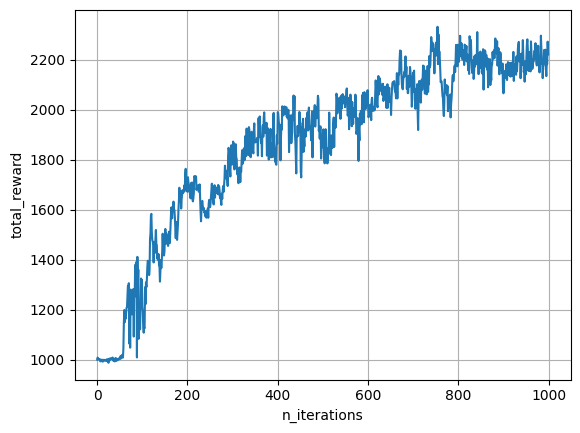

In [ ]:
env = gym.make("Ant-v4", render_mode="rgb_array")
policy = train_augmented_random_search(env=env, n_iter=1000)

In [ ]:
with gym.make("Ant-v4", render_mode="rgb_array") as env, RecordVideo(
    env=env, video_folder="./videos"
) as env_monitor:
    evaluate_policy(env_monitor, policy, 1000)

Moviepy - Building video /content/videos/rl-video-episode-0.mp4.
Moviepy - Writing video /content/videos/rl-video-episode-0.mp4



Moviepy - Done !
Moviepy - video ready /content/videos/rl-video-episode-0.mp4


In [ ]:
# Show video. This may not work in some setups. If it doesn't
# work for you, you can download the videos and view them locally.

from pathlib import Path
from base64 import b64encode
from IPython.display import HTML

video_paths = sorted([s for s in Path('videos').iterdir() if s.suffix == '.mp4'])
video_path = video_paths[0]  # You can also try other indices

if 'google.colab' in sys.modules:
    # https://stackoverflow.com/a/57378660/1214547
    with video_path.open('rb') as fp:
        mp4 = fp.read()
    data_url = 'data:video/mp4;base64,' + b64encode(mp4).decode()
else:
    data_url = str(video_path)

HTML("""
<video width="640" height="480" controls>
  <source src="{}" type="video/mp4">
</video>
""".format(data_url))